In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy
from matplotlib import pyplot as plt

from matplotlib.axes import Axes
import plotly.express as px
from scipy.stats import f_oneway
from scipy.stats import ttest_ind
from scipy.stats import chi2_contingency

# Data preparation

In [2]:
path = 'Airbnb_Open_Data.csv'

In [3]:
airbnb_df = pd.read_csv(path,low_memory=False)

In [4]:
airbnb_df.shape

(102599, 26)

In [5]:
airbnb_df = airbnb_df.rename(columns = lambda column_name: column_name.lower().replace(' ','_'))

In [6]:
duplicateв_airbnb_df = airbnb_df.duplicated()
duplicateв_airbnb_df.value_counts()

False    102058
True        541
Name: count, dtype: int64

In [7]:
airbnb_df.drop_duplicates(keep='first')

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102053,57365208,Cozy bright room near Prospect Park,77326652202,unconfirmed,Mariam,Brooklyn,Flatbush,40.64945,-73.96108,United States,...,NaN,7.0,12.0,3/27/2019,0.44,5.0,1.0,0.0,Shoes off Clean After yourself Turn Lights and...,NaN
102054,57365760,Private Bedroom with Amazing Rooftop View,45936254757,verified,Trey,Brooklyn,Bushwick,40.69872,-73.92718,United States,...,NaN,1.0,19.0,8/31/2017,0.72,3.0,2.0,0.0,#NAME?,NaN
102055,57366313,Pretty Brooklyn One-Bedroom for 2 to 4 people,23801060917,verified,Michael,Brooklyn,Bedford-Stuyvesant,40.67810,-73.90822,United States,...,NaN,2.0,50.0,6/26/2019,3.12,4.0,2.0,235.0,* Check out: 10am * We made an effort to keep ...,NaN
102056,57366865,Room & private bathroom in historic Harlem,15593031571,unconfirmed,Shireen,Manhattan,Harlem,40.81248,-73.94317,United States,...,NaN,2.0,0.0,NaN,NaN,1.0,1.0,0.0,Each of us is working and/or going to school a...,NaN


In [8]:
airbnb_df.dtypes

id                                  int64
name                               object
host_id                             int64
host_identity_verified             object
host_name                          object
neighbourhood_group                object
neighbourhood                      object
lat                               float64
long                              float64
country                            object
country_code                       object
instant_bookable                   object
cancellation_policy                object
room_type                          object
construction_year                 float64
price                              object
service_fee                        object
minimum_nights                    float64
number_of_reviews                 float64
last_review                        object
reviews_per_month                 float64
review_rate_number                float64
calculated_host_listings_count    float64
availability_365                  

In [9]:
airbnb_df.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified               289
host_name                            406
neighbourhood_group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country_code                         131
instant_bookable                     105
cancellation_policy                   76
room_type                              0
construction_year                    214
price                                247
service_fee                          273
minimum_nights                       409
number_of_reviews                    183
last_review                        15893
reviews_per_month                  15879
review_rate_number                   326
calculated_host_listings_count       319
availability_365                     448
house_rules     

# Data Cleaning

In [10]:
auxiliary_df=airbnb_df[['lat','long','country','country_code','neighbourhood_group','neighbourhood']].drop_duplicates()

In [11]:
auxiliary_df[auxiliary_df.country.isnull()]

,lat,long,country,country_code,neighbourhood_group,neighbourhood
156,40.73226,-74.00401,NaN,NaN,Manhattan,West Village
157,40.71363,-73.96398,NaN,NaN,Brooklyn,Williamsburg
158,40.77711,-73.95270,NaN,NaN,Manhattan,Upper East Side
159,40.68559,-73.98094,NaN,NaN,Brooklyn,Boerum Hill
160,40.77456,-73.95323,NaN,NaN,Manhattan,Upper East Side
...,...,...,...,...,...,...
101368,40.66063,-73.98348,NaN,US,Brooklyn,Windsor Terrace
101369,40.70588,-74.01590,NaN,US,Manhattan,Financial District
101370,40.68438,-73.95299,NaN,US,Brooklyn,Bedford-Stuyvesant
101371,40.77759,-73.95321,NaN,US,Manhattan,Upper East Side


In [12]:
airbnb_df.country.value_counts(normalize=True)

country
United States    1.0
Name: proportion, dtype: float64

In [13]:
airbnb_df.neighbourhood_group.value_counts(normalize=True)

neighbourhood_group
Manhattan        0.426947
Brooklyn         0.407936
Queens           0.129346
Bronx            0.026440
Staten Island    0.009311
brookln          0.000010
manhatan         0.000010
Name: proportion, dtype: float64

In [14]:
auxiliary_df=airbnb_df[['neighbourhood_group','neighbourhood']].drop_duplicates()

In [15]:
auxiliary_df['neighbourhood_group'] = auxiliary_df['neighbourhood_group'].str.title()\
                                      .replace('Manhatan','Manhattan')\
                                      .replace('Brookln','Brooklyn')

In [16]:
auxiliary_df.neighbourhood_group.value_counts(normalize=True)

neighbourhood_group
Queens           0.228070
Brooklyn         0.219298
Bronx            0.210526
Staten Island    0.192982
Manhattan        0.149123
Name: proportion, dtype: float64

In [17]:
neighbourhood_df = auxiliary_df.drop_duplicates().dropna (subset=['neighbourhood_group']).sort_values(by='neighbourhood')

In [18]:
neighbourhood_df = neighbourhood_df.dropna (subset=['neighbourhood']).sort_values(by='neighbourhood')

In [19]:
neighbourhood_df[neighbourhood_df.neighbourhood_group.isnull()]

,neighbourhood_group,neighbourhood


In [20]:
data_pd = pd.merge(airbnb_df,neighbourhood_df,on=['neighbourhood'], how='left')

In [21]:
data_pd['neighbourhood_group_y'].fillna(data_pd.neighbourhood_group_x,inplace =True)

In [22]:
data_pd.host_identity_verified.value_counts(normalize=True)

host_identity_verified
unconfirmed    0.50044
verified       0.49956
Name: proportion, dtype: float64

In [23]:
data_pd.head()

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group_x,neighbourhood,lat,long,country,...,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license,neighbourhood_group_y
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN,Brooklyn
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN,Manhattan
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN,Manhattan
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN,Brooklyn
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN,Manhattan


In [24]:
columns=['id','host_id','host_identity_verified','host_name','country','country_code',
         'last_review','reviews_per_month','calculated_host_listings_count','house_rules','license', 'neighbourhood_group_x']

data_pd.drop(columns,axis=1,inplace=True)
data_pd.rename(columns={'neighbourhood_group_y':'neighbourhood_group'},inplace=True)

In [25]:
data_pd['price'] = data_pd['price'].replace({'\$': '', ',': ''}, regex=True).astype(float)
data_pd['service_fee'] = data_pd['service_fee'].replace({'\$': '', ',': ''}, regex=True).astype(float)

In [26]:
data_pd.isna().sum()

name                   250
neighbourhood           16
lat                      8
long                     8
instant_bookable       105
cancellation_policy     76
room_type                0
construction_year      214
price                  247
service_fee            273
minimum_nights         409
number_of_reviews      183
review_rate_number     326
availability_365       448
neighbourhood_group      0
dtype: int64

In [27]:
cols_to_drop = []

for col in data_pd.columns:
    if (data_pd[col].isna().sum()/data_pd.shape[0])>0.8:
        cols_to_drop.append(col)
cols_to_drop

[]

In [28]:
(airbnb_df.isnull().sum()).sum()

190769

In [29]:
(data_pd.isnull().sum()).sum()

2563

In [30]:
data_pd.dropna(inplace=True)

In [31]:
data_pd.construction_year =data_pd.construction_year.astype(int)

In [32]:
(data_pd.isnull().sum()).sum()

0

# EDA

In [33]:
data_pd.dtypes

name                    object
neighbourhood           object
lat                    float64
long                   float64
instant_bookable        object
cancellation_policy     object
room_type               object
construction_year        int32
price                  float64
service_fee            float64
minimum_nights         float64
number_of_reviews      float64
review_rate_number     float64
availability_365       float64
neighbourhood_group     object
dtype: object

In [34]:
data_pd.describe()

,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,review_rate_number,availability_365
count,100383.000000,100383.000000,100383.000000,100383.000000,100383.00000,100383.000000,100383.000000,100383.00000,100383.000000
mean,40.728051,-73.949629,2012.487373,625.400775,125.08089,8.065121,27.292480,3.27940,140.856908
std,0.055880,0.049561,5.762697,331.638574,66.33107,28.319720,49.055289,1.28437,135.406688
min,40.499790,-74.249840,2003.000000,50.000000,10.00000,-1223.000000,0.000000,1.00000,-10.000000
25%,40.688720,-73.982570,2008.000000,340.000000,68.00000,2.000000,1.000000,2.00000,3.000000
50%,40.722260,-73.954440,2012.000000,625.000000,125.00000,3.000000,7.000000,3.00000,96.000000
75%,40.762790,-73.932335,2017.000000,913.000000,183.00000,5.000000,30.000000,4.00000,268.000000
max,40.916970,-73.705220,2022.000000,1200.000000,240.00000,5645.000000,1024.000000,5.00000,3677.000000


In [35]:
for column in data_pd:
    if data_pd[column].dtype!=object:
        len_c = len(data_pd[column].loc[data_pd[column] < 0])
        if len_c>0:
            print(len_c,column)

100383 long
12 minimum_nights
415 availability_365


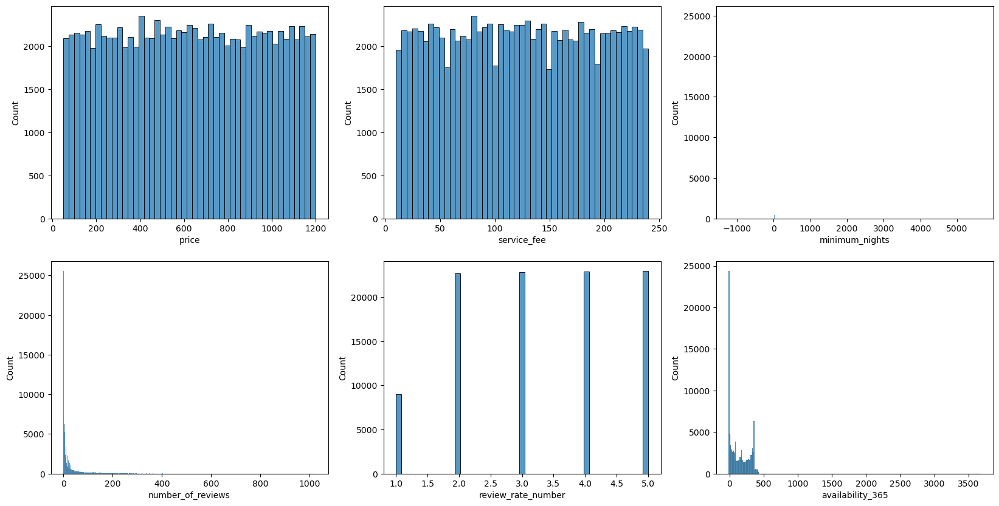

In [36]:
columns = ['price', 'service_fee', 'minimum_nights','number_of_reviews','review_rate_number', 'availability_365']
fig,ax = plt.subplots(2,3, figsize = (20,10))
ax = ax.flatten()
for i in range(len(columns)):
    sns.histplot(data_pd[columns[i]],ax = ax[i])

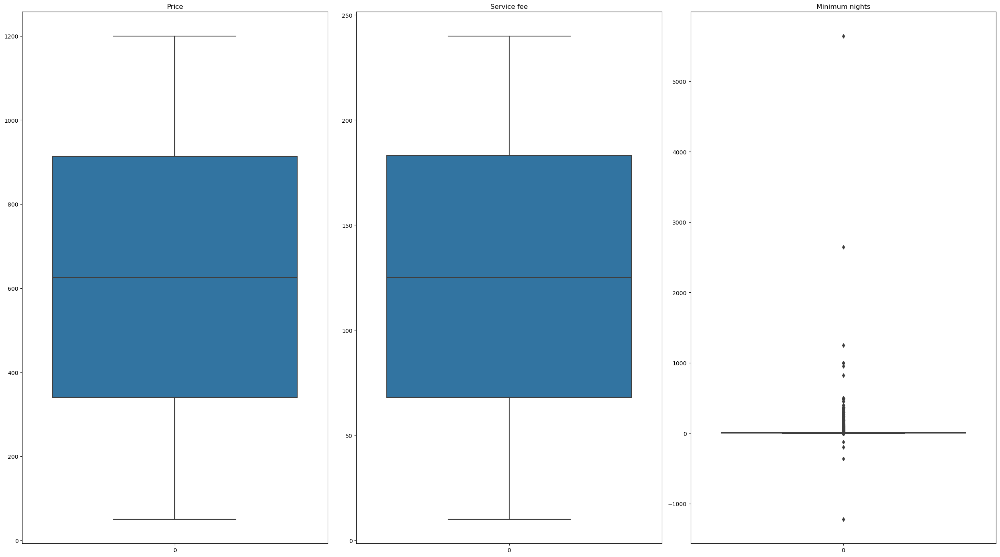

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(25, 14))

sns.boxplot (data=data_pd.price, ax=axes[0])
axes[0].set_title('Price')

sns.boxplot(data=data_pd.service_fee, ax=axes[1])
axes[1].set_title('Service fee')

sns.boxplot(data=data_pd.minimum_nights, ax=axes[2])
axes[2].set_title('Minimum nights')

plt.tight_layout()


plt.show()

In [38]:
data_pd['minimum_nights'] = np.where(data_pd['minimum_nights'] < 0, 0, data_pd['minimum_nights'])
data_pd['availability_365'] = np.where(data_pd['availability_365'] < 0, 0, data_pd['availability_365'])
data_pd['availability_365'] = np.where(data_pd['availability_365'] > 366, 0, data_pd['availability_365'])
data_pd['name'] = np.where(data_pd['name'] == '#NAME?', 0, data_pd['name'])

<Axes: >

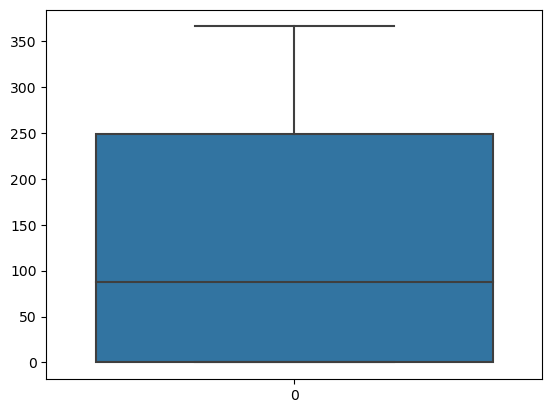

In [39]:
sns.boxplot(data=data_pd.availability_365)

In [40]:
lower_percentile = data_pd.minimum_nights.quantile(0.01)
upper_percentile = data_pd.minimum_nights.quantile(0.99)

data_pd = data_pd[(data_pd.minimum_nights > lower_percentile) & (data_pd.minimum_nights < upper_percentile)]

In [41]:
data_pd['days_booked'] = (365 - data_pd['availability_365'])

In [42]:
data_pd['revenue'] = data_pd['price'] * data_pd['days_booked']

In [43]:
data_pd.groupby(['construction_year','neighbourhood_group'],as_index=False)\
    .agg({'revenue':'sum'})\
    .sort_values(by=['construction_year','revenue'],ascending=[False,False])\
    .query("construction_year>2018")\
    .reset_index(drop=True)

,construction_year,neighbourhood_group,revenue
0,2022,Brooklyn,257953799.0
1,2022,Manhattan,236038254.0
2,2022,Queens,53456183.0
3,2022,Bronx,13343896.0
4,2022,Staten Island,2028045.0
5,2021,Manhattan,234978082.0
6,2021,Brooklyn,219721480.0
7,2021,Queens,68448983.0
8,2021,Bronx,10297648.0
9,2021,Staten Island,3701649.0


In [44]:
data_pd

,name,neighbourhood,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,review_rate_number,availability_365,neighbourhood_group,days_booked,revenue
0,Clean & quiet apt home by the park,Kensington,40.64749,-73.97237,False,strict,Private room,2020,966.0,193.0,10.0,9.0,4.0,286.0,Brooklyn,79.0,76314.0
1,Skylit Midtown Castle,Midtown,40.75362,-73.98377,False,moderate,Entire home/apt,2007,142.0,28.0,30.0,45.0,4.0,228.0,Manhattan,137.0,19454.0
2,THE VILLAGE OF HARLEM....NEW YORK !,Harlem,40.80902,-73.94190,True,flexible,Private room,2005,620.0,124.0,3.0,0.0,5.0,352.0,Manhattan,13.0,8060.0
4,Entire Apt: Spacious Studio/Loft by central park,East Harlem,40.79851,-73.94399,False,moderate,Entire home/apt,2009,204.0,41.0,10.0,9.0,3.0,289.0,Manhattan,76.0,15504.0
5,Large Cozy 1 BR Apartment In Midtown East,Murray Hill,40.74767,-73.97500,True,flexible,Entire home/apt,2013,577.0,115.0,3.0,74.0,3.0,0.0,Manhattan,365.0,210605.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102586,Patio Oasis in Upper East Side,Upper East Side,40.77703,-73.94773,True,strict,Entire home/apt,2003,208.0,42.0,4.0,8.0,5.0,159.0,Manhattan,206.0,42848.0
102589,Lrg room 1 block from Prospect Park,Flatbush,40.65231,-73.96189,False,flexible,Private room,2006,306.0,61.0,3.0,0.0,1.0,200.0,Brooklyn,165.0,50490.0
102591,Columbus Ave Apt 1 block from Park,Upper West Side,40.77408,-73.98181,False,strict,Entire home/apt,2005,1139.0,228.0,5.0,17.0,5.0,134.0,Manhattan,231.0,263109.0
102596,"Comfy, bright room in Brooklyn",Park Slope,40.67505,-73.98045,True,moderate,Private room,2009,988.0,198.0,3.0,0.0,5.0,342.0,Brooklyn,23.0,22724.0


In [45]:
avg_revenue = data_pd.groupby(['neighbourhood_group'],as_index=False)\
    .agg({'revenue':'mean'})\
    .sort_values(by=['revenue'],ascending=[False])\
    .reset_index(drop=True)

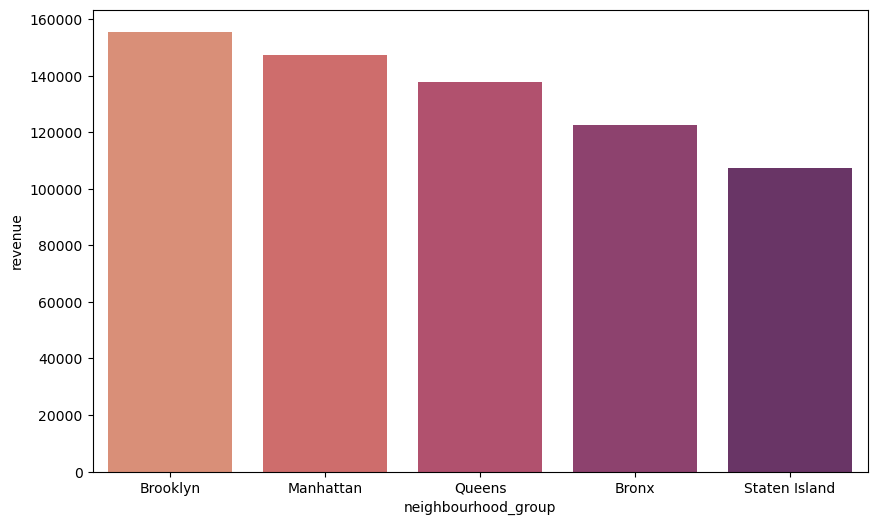

In [46]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x="neighbourhood_group", y="revenue", data=avg_revenue,palette = "flare")
plt.show() 

In [47]:
data_pd.groupby(['neighbourhood_group'],as_index=False)\
    .agg({'price':'mean'})\
    .sort_values(by=['price'],ascending=[False])\
    .reset_index(drop=True)

,neighbourhood_group,price
0,Queens,630.719341
1,Bronx,630.567873
2,Staten Island,629.149123
3,Brooklyn,627.203906
4,Manhattan,622.204077


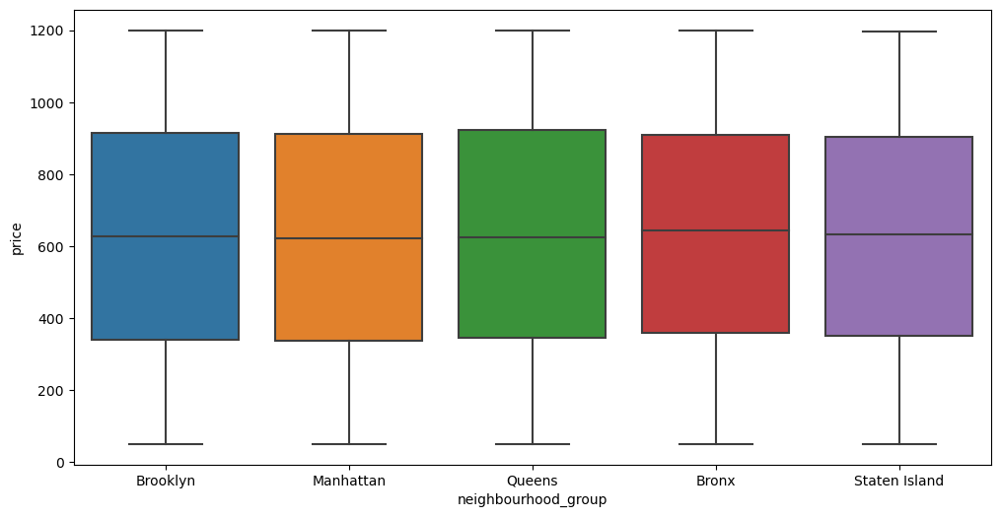

In [48]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="neighbourhood_group", y="price", data=data_pd)
plt.show()

In [49]:
data_pd.groupby(['neighbourhood_group'],as_index=False)\
    .agg({'review_rate_number':'mean'})\
    .sort_values(by=['review_rate_number'],ascending=[False])\
    .reset_index(drop=True)

,neighbourhood_group,review_rate_number
0,Staten Island,3.387427
1,Queens,3.336791
2,Bronx,3.318439
3,Manhattan,3.281762
4,Brooklyn,3.259804


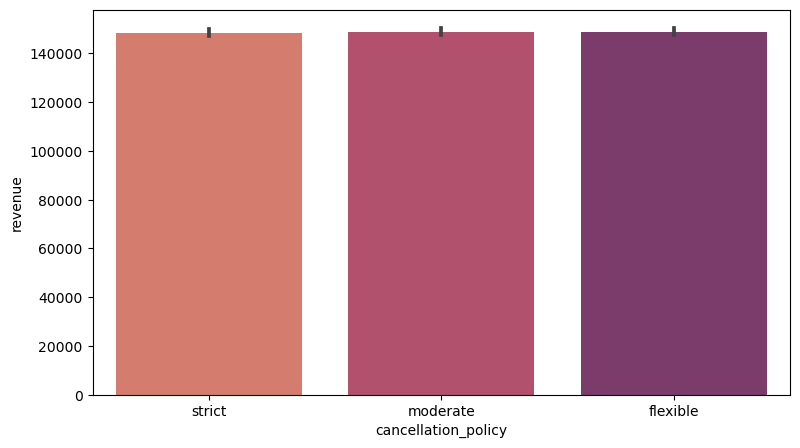

In [50]:
plt.figure(figsize=(9, 5))
ax = sns.barplot(x="cancellation_policy", y="revenue", data=data_pd,palette = "flare")
plt.show()

In [51]:
review_rate_number_5 = data_pd[['neighbourhood_group','name','review_rate_number']].loc[data_pd.review_rate_number==5]\
                                         .groupby(['neighbourhood_group'],as_index=False)\
                                         .agg({'name':pd.Series.nunique})\
                                         .reset_index(drop=True)

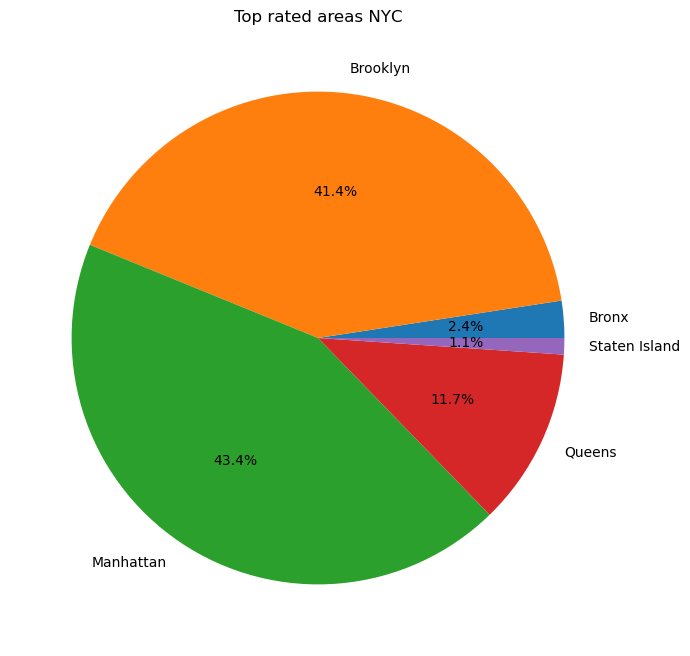

In [52]:
plt.figure(figsize=(12, 8))
category = review_rate_number_5["name"]
plt.pie(
    x=category,
    labels=review_rate_number_5["neighbourhood_group"],
    autopct='%1.1f%%'
)
plt.title(label='Top rated areas NYС')
plt.show()


In [53]:
neighbourhood_group_review= data_pd.groupby(['neighbourhood_group','review_rate_number'],as_index=False)\
                        .agg({'name': pd.Series.nunique})\
                        .sort_values(by=['review_rate_number','name'],ascending=[False,False])\
                        .reset_index(drop=True)

In [54]:
neighbourhood_group_review.rename(columns={'name':'count_of_hotels'},inplace=True)
neighbourhood_group_review.head(10)

,neighbourhood_group,review_rate_number,count_of_hotels
0,Manhattan,5.0,4885
1,Brooklyn,5.0,4656
2,Queens,5.0,1311
3,Bronx,5.0,273
4,Staten Island,5.0,121
5,Manhattan,4.0,4835
6,Brooklyn,4.0,4769
7,Queens,4.0,1351
8,Bronx,4.0,289
9,Staten Island,4.0,99


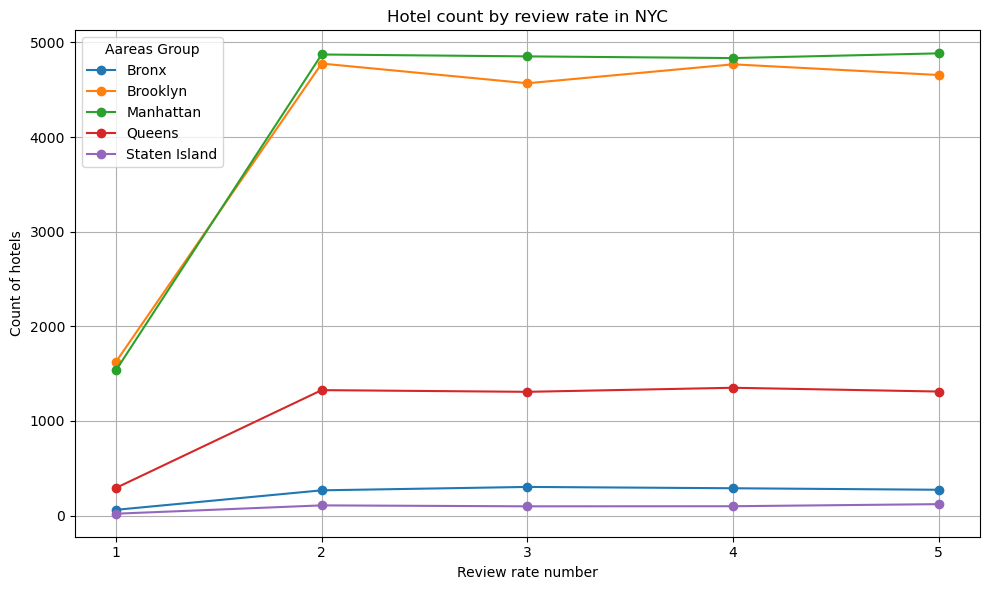

In [55]:
pivot_df = neighbourhood_group_review.pivot(index='review_rate_number', columns='neighbourhood_group')

plt.figure(figsize=(10, 6))

for col in pivot_df.columns:
    plt.plot(pivot_df.index, pivot_df[col], marker='o', label=col[1])

plt.title('Hotel count by review rate in NYC')
plt.xlabel('Review rate number')
plt.ylabel('Count of hotels')
plt.legend(title='Aareas Group')
plt.xticks(pivot_df.index)
plt.grid(True)
plt.tight_layout()
plt.show()

In [56]:
fig = px.scatter_mapbox(
    data_pd, 
    lat= "lat",
    lon= "long",
    center={"lat": 40.7128, "lon": -74.0060},  
    width=800,
    height=800,  
    hover_data=["neighbourhood", "price"], 
) 

fig.update_layout(mapbox_style="open-street-map")

fig.show()

In [57]:
df_pr = data_pd.groupby(['neighbourhood_group'],as_index=False)\
    .agg({'price':'mean','service_fee':'mean'})\
    .sort_values(by=['price','service_fee'],ascending=[False,False])\
    .reset_index(drop=True)

In [58]:
df_pr

,neighbourhood_group,price,service_fee
0,Queens,630.719341,126.148627
1,Bronx,630.567873,126.115950
2,Staten Island,629.149123,125.828947
3,Brooklyn,627.203906,125.442503
4,Manhattan,622.204077,124.440990


In [59]:
data_pd[['revenue', 'service_fee']].describe()

,revenue,service_fee
count,74370.000000,74370.000000
mean,148787.872301,125.107194
std,120457.907312,66.338987
min,-1178.000000,10.000000
25%,42529.250000,68.000000
50%,121018.500000,125.000000
75%,236155.000000,183.000000
max,438000.000000,240.000000


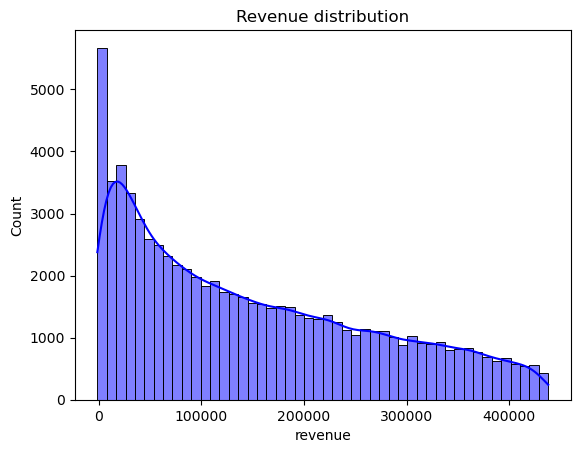

In [60]:
sns.histplot(data_pd['revenue'], kde=True, color='blue')
plt.title('Revenue distribution')

plt.show()

# Correlation Matrix

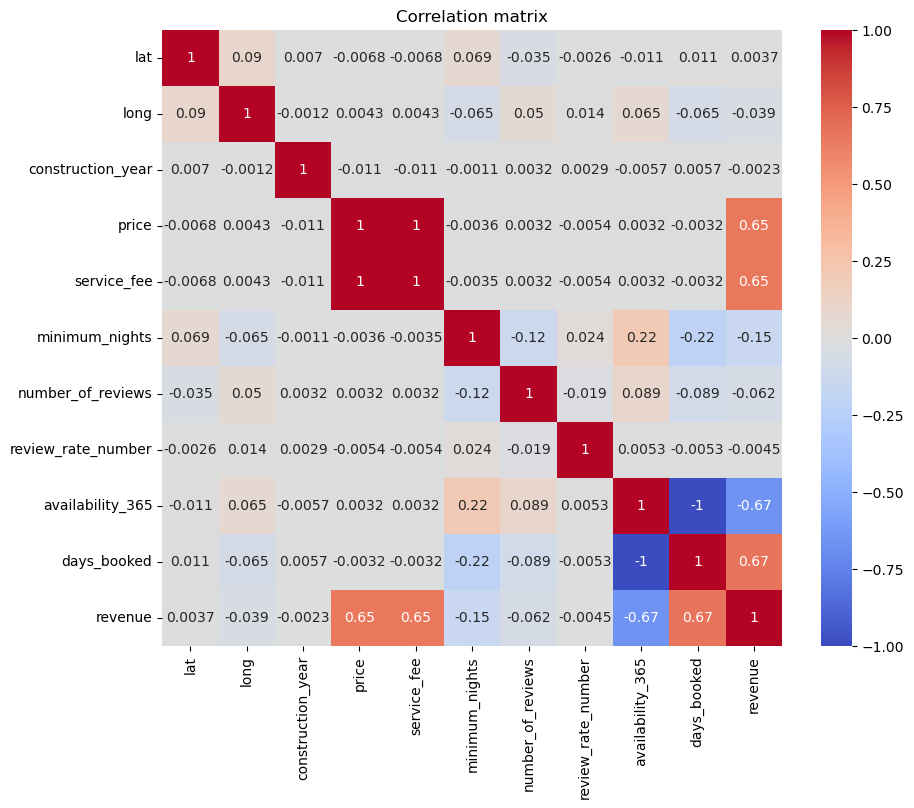

In [61]:
corr_matrix = data_pd.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation matrix')
plt.show()

 **Корреляция между ценой, комиссией за услугу и `revenue` (0,65):**`revenue` рассчитывается с использованием цены. C ростом `price` увеличивается и `revenue`, учитывая формулу расчета.
`Service_fee`, вероятно, пропорционален `price`, что приводит к аналогичной положительной корреляции с `revenue`.

Сильная отрицательная **корреляция между `availability_365` и `days_booked` (-1,0)**:`days_booked` рассчитываются 365 – `availability_365`. 
`Revenue` рассчитывается как `price` * `days_booked`, логично, что количество забронированных дней положительно коррелирует с доходом. Чем больше дней забронировано жилье, тем выше доход.

Слабая **корреляция между `minimum_nights` и `days_booked` (-0,22)**: объекты с более высоким минимальным требованием пребывания могут быть забронированы на меньшее количество дней, но связь не является сильной.

In [62]:
top_15 =data_pd.groupby(['name'],as_index=False)\
    .agg({'revenue':'sum'})\
    .sort_values(by=['revenue'],ascending=[False])\
    .reset_index(drop=True)\
    .query("name!=0")\
    .head(15)

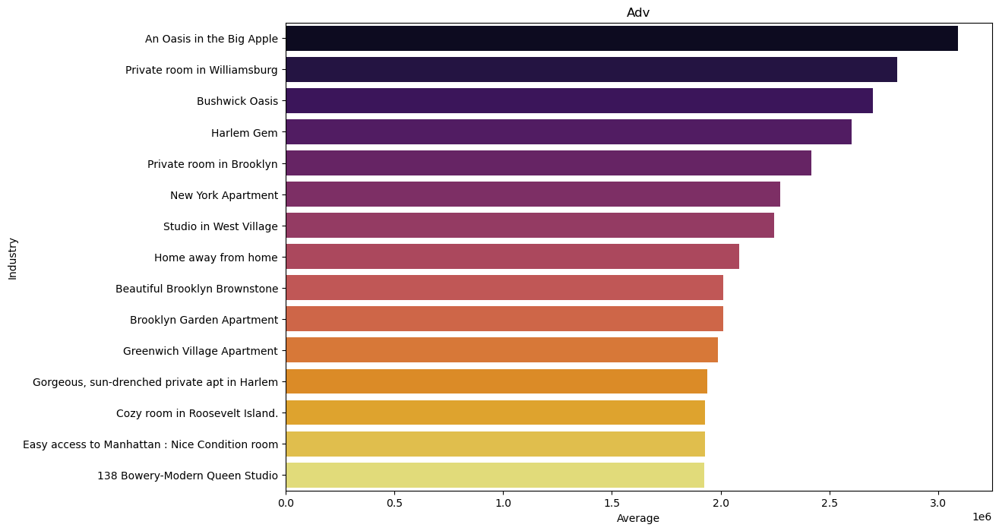

In [63]:
plt.figure(figsize=(12, 8))
sns.barplot(y=top_15.name, x=top_15.revenue, palette='inferno')
plt.title('Adv')
plt.xlabel('Average')
plt.ylabel('Industry')
plt.show()

In [64]:
top_15

,name,revenue
1,An Oasis in the Big Apple,3092280.0
2,Private room in Williamsburg,2811966.0
3,Bushwick Oasis,2698012.0
4,Harlem Gem,2603228.0
5,Private room in Brooklyn,2416261.0
6,New York Apartment,2275185.0
7,Studio in West Village,2246940.0
8,Home away from home,2084735.0
9,Beautiful Brooklyn Brownstone,2013483.0
10,Brooklyn Garden Apartment,2012824.0


In [65]:
data_pd.dtypes

name                    object
neighbourhood           object
lat                    float64
long                   float64
instant_bookable        object
cancellation_policy     object
room_type               object
construction_year        int32
price                  float64
service_fee            float64
minimum_nights         float64
number_of_reviews      float64
review_rate_number     float64
availability_365       float64
neighbourhood_group     object
days_booked            float64
revenue                float64
dtype: object

# Anova

In [66]:
def st_anova(data_frame, group_column, target_column):
    unique_groups = data_frame[group_column].unique()
    group_data = [data_frame[data_frame[group_column] == group][target_column] for group in unique_groups]  
    anova_result = f_oneway(*group_data)
    
    return {'Group column': unique_groups,'Target_column': target_column,
            'F-statistic': anova_result.statistic, 'P-value': anova_result.pvalue}

In [67]:
st_anova(data_pd, 'neighbourhood_group', 'revenue')

{'Group column': array(['Brooklyn', 'Manhattan', 'Queens', 'Bronx', 'Staten Island'],
       dtype=object),
 'Target_column': 'revenue',
 'F-statistic': 86.00094862566023,
 'P-value': 5.1147898619913e-73}

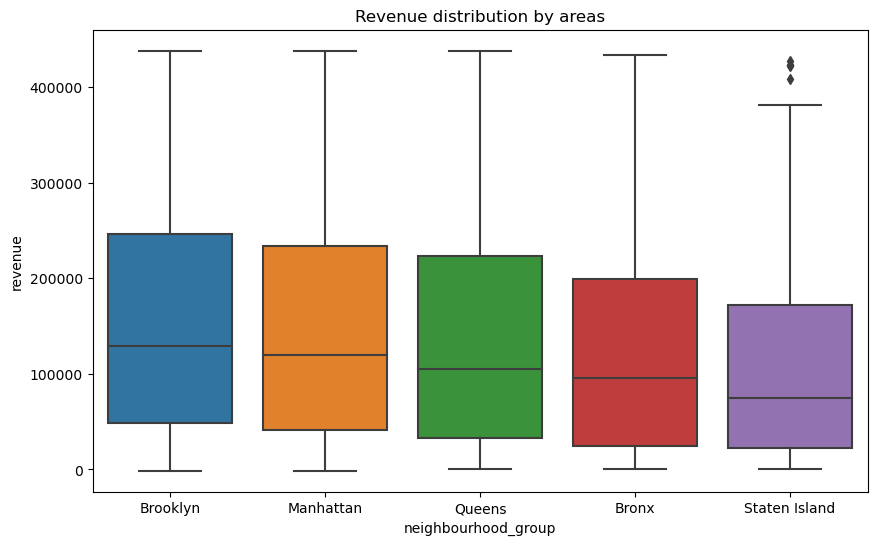

In [68]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='neighbourhood_group', y='revenue', data=data_pd)
plt.title('Revenue distribution by areas')
plt.show()

Существует статистически значимая разница в средних значениях прибыли между разными группами районов (`neighbourhood_group`). 

In [69]:
st_anova(data_pd, 'cancellation_policy', 'days_booked')

{'Group column': array(['strict', 'moderate', 'flexible'], dtype=object),
 'Target_column': 'days_booked',
 'F-statistic': 0.47034581997865393,
 'P-value': 0.6247880259663627}

Нет статистически значимых различий в количестве забронированных дней (`days_booked`) между различными политиками отмены (`cancellation_policy`).

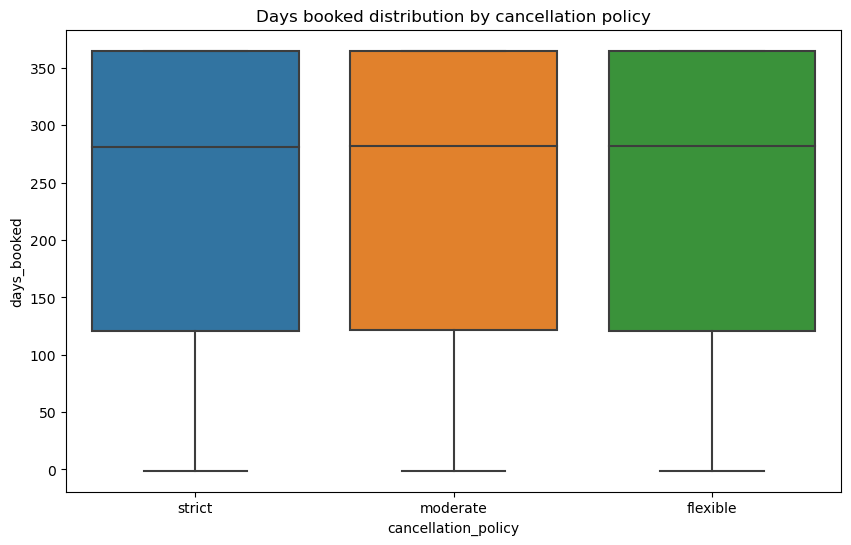

In [70]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='cancellation_policy', y='days_booked', data=data_pd)
plt.title('Days booked distribution by cancellation policy')
plt.show()

# T-test

In [71]:
def st_ttest(data_pd, binary_column, target_column, group_values=[True, False]):
    group_1 = data_pd[data_pd[binary_column] == group_values[0]][target_column]
    group_2 = data_pd[data_pd[binary_column] == group_values[1]][target_column]

    ttest_result = ttest_ind(group_1, group_2)

    return {'T-statistic': ttest_result.statistic, 'P-value': ttest_result.pvalue}

In [72]:
ttest_result = st_ttest(data_pd, 'instant_bookable', 'revenue')
print('T-statistic:', ttest_result['T-statistic'])
print('P-value:', ttest_result['P-value'])

T-statistic: 0.57784461327903
P-value: 0.5633707814619937


P-value больше 0.05, можно заключить, что не существует статистически значимой разница в прибыли (revenue) между двумя группами.

# Chi_test

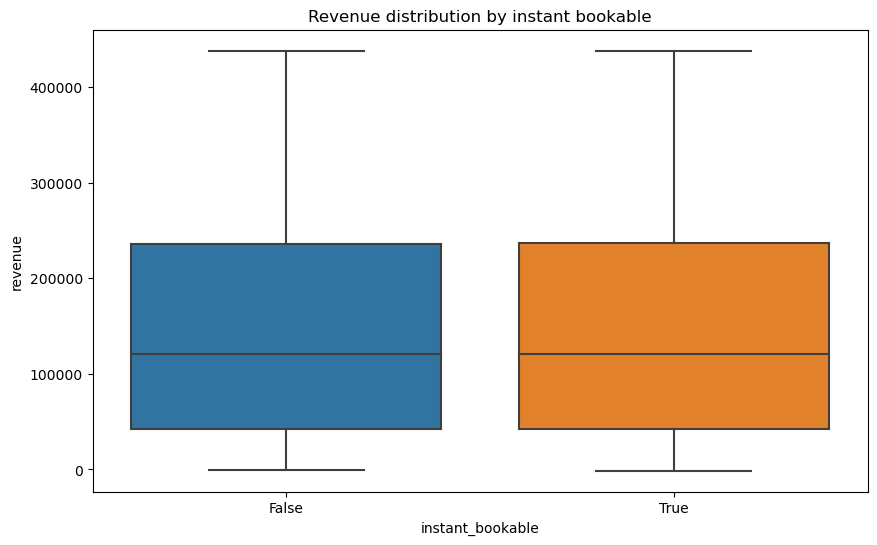

In [73]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='instant_bookable', y='revenue', data=data_pd)
plt.title('Revenue distribution by instant bookable')
plt.show()

In [74]:
def st_chi2_test(df, col1, col2):

    contingency_table = pd.crosstab(df[col1], df[col2])
    chi2_result = chi2_contingency(contingency_table)
    
    return {'Chi-square statistic': chi2_result[0], 'P-value': chi2_result[1]}

In [75]:
chi2_result = st_chi2_test(data_pd, 'neighbourhood_group', 'room_type')
print('Chi-square statistic:', chi2_result['Chi-square statistic'])
print('P-value:', chi2_result['P-value'])

Chi-square statistic: 1903.0718534492307
P-value: 0.0


Нулевое значение p-value говорит о том, что существует статистически значимая зависимость между районом (`neighbourhood_group`) и типом комнаты (`room_type`).

Высокое значение статистики хи-квадрат говорит о сильной ассоциации между переменными.

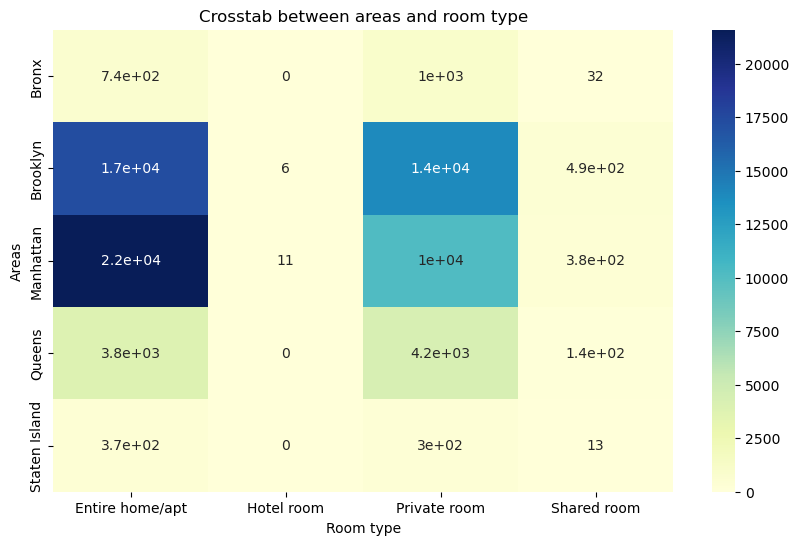

In [76]:
plt.figure(figsize=(10, 6))
sns.heatmap(pd.crosstab(data_pd['neighbourhood_group'], data_pd['room_type']), annot=True, cmap="YlGnBu")
plt.title('Crosstab between areas and room type')
plt.xlabel('Room type')
plt.ylabel('Areas')
plt.show()

**Сильная зависимость между районами и типом жилья:**

Manhattan и Brooklyn имеют наибольшее количество предложенийс типом жилья "Entire home/apt" и "Private room".
Практически нет предложений отелей ("Hotel room") в большинстве районов,
кроме как в Brooklyn и Manhattan. Это подчеркивает их уникальность и низкую популярность этого типа жилья в других районах. 

Manhattan и Brooklyn явно доминируют по количеству предложений по сравнению с другим и районами. Это может указывать на более высокий спрос на аренду жилья в этих районах,
что может быть связано с их популярностью и расположением в городе.

Bronx, Queens, и Staten Island имеют гораздо меньше предложений, в них предпочтение отдается другим типам жилья.

In [77]:
chi2_result = st_chi2_test(data_pd, 'instant_bookable', 'cancellation_policy')
print('Chi-square statistic:', chi2_result['Chi-square statistic'])
print('P-value:', chi2_result['P-value'])

Chi-square statistic: 6.799507128578825
P-value: 0.033381495339295304


 Поскольку \(P-value\) меньше 0.05, это означает, что между переменными `instant_bookable` и `cancellation_policy` существует статистически значимая зависимость. Это говорит о том, что вероятность моментального бронирования каким-то образом связана с политикой отмены.


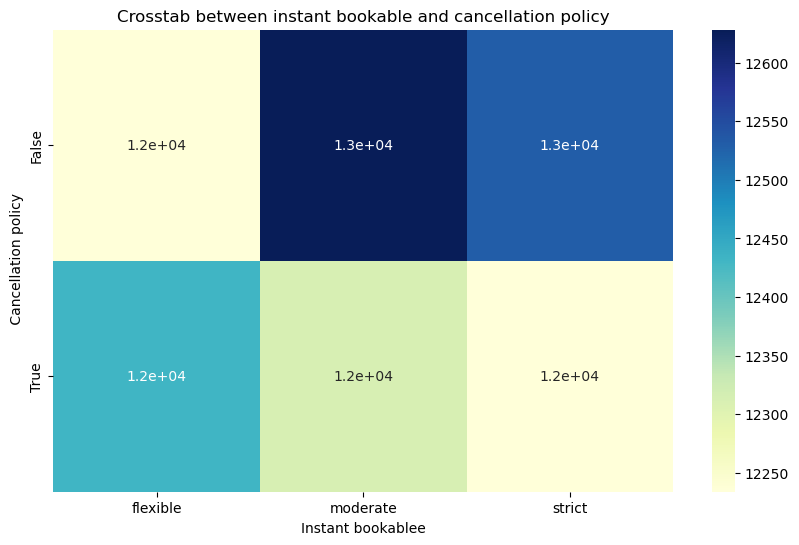

In [78]:
plt.figure(figsize=(10, 6))
sns.heatmap(pd.crosstab(data_pd['instant_bookable'], data_pd['cancellation_policy']), annot=True, cmap="YlGnBu")
plt.title('Crosstab between instant bookable and cancellation policy')
plt.xlabel('Instant bookablee')
plt.ylabel(' Cancellation policy')
plt.show()